# Setup

Install dependencies and check GPU.

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
from yolov5 import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.0-218-g7539cd7 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.2/78.2 GB disk)


In [ ]:
!unzip -q ../train_data.zip -d ../

In [ ]:
!zip -r '/content/"yolov5.zip"' '/content/yolov5'

In [47]:
!zip -r '/content/weights.zip' '/content/yolov5/runs/train/exp4/weights'

  adding: content/yolov5/runs/train/exp4/weights/ (stored 0%)
  adding: content/yolov5/runs/train/exp4/weights/last.pt (deflated 9%)
  adding: content/yolov5/runs/train/exp4/weights/best.pt (deflated 9%)


## 1. Football & Tennisball Dataset

Populating the interactive namespace from numpy and matplotlib


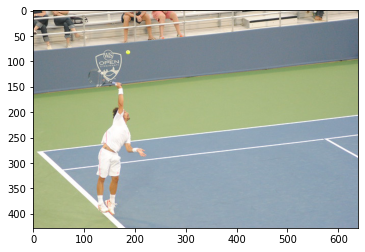

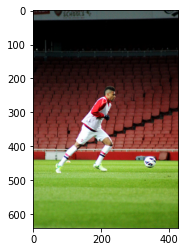

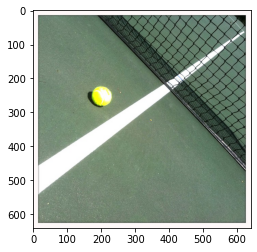

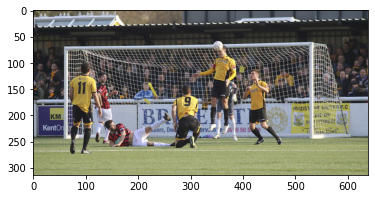

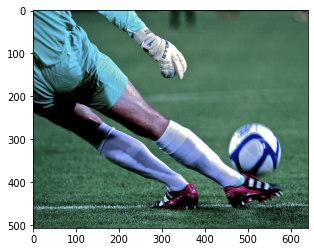

In [25]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os

train_dir = '/content/train_data/images/train/'
directory = os.fsencode(train_dir)

for index,image_path in enumerate(os.listdir(train_dir)):
  if index == 5:
    break
  input_path = os.path.join(train_dir, image_path)
  img = mpimg.imread(input_path)
  imgplot = plt.imshow(img)
  plt.show()

# 2. Config - Hyperparameter Tuning - Train

In [ ]:
# Train YOLOv5s on COCO128 for 3 epochs
!python train.py --img 640 --batch 2 --epochs 100 --data custom_data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=custom_data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=100, batch_size=2, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-218-g7539cd7 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scale=

## 3. Evaluating - Model Metrics

In [ ]:
# Tensorboard  (optional)
%load_ext tensorboard
%tensorboard --logdir runs/train

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 751), started 0:42:40 ago. (Use '!kill 751' to kill it.)

<IPython.core.display.Javascript object>

# 1. Prediction

In [11]:
!python detect.py --weights runs/train/exp4/weights/last.pt --img 640 --conf 0.35 --source ../test_video.mp4
# display.Image(filename='runs/detect/exp/zidane.jpg', width=600)

detect: weights=['runs/train/exp4/weights/last.pt'], source=../test_video.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.35, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-218-g7539cd7 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/747) /content/test_video.mp4: 352x640 1 Tennisball, Done. (0.027s)
video 1/1 (2/747) /content/test_video.mp4: 352x640 1 Tennisball, Done. (0.027s)
video 1/1 (3/747) /content/test_video.mp4: 352x640 1 Tennisball, Done. (0.026s)
video 1/1 (4/747) /content/test_video.mp4: 352x640 1 Tennisball, Done. (0.027s)
video 1/1 (5/747) /content/test_video.mp4: 352x640 1 T

## Evaluate Test Data with Predictions

************* Test Labels *************


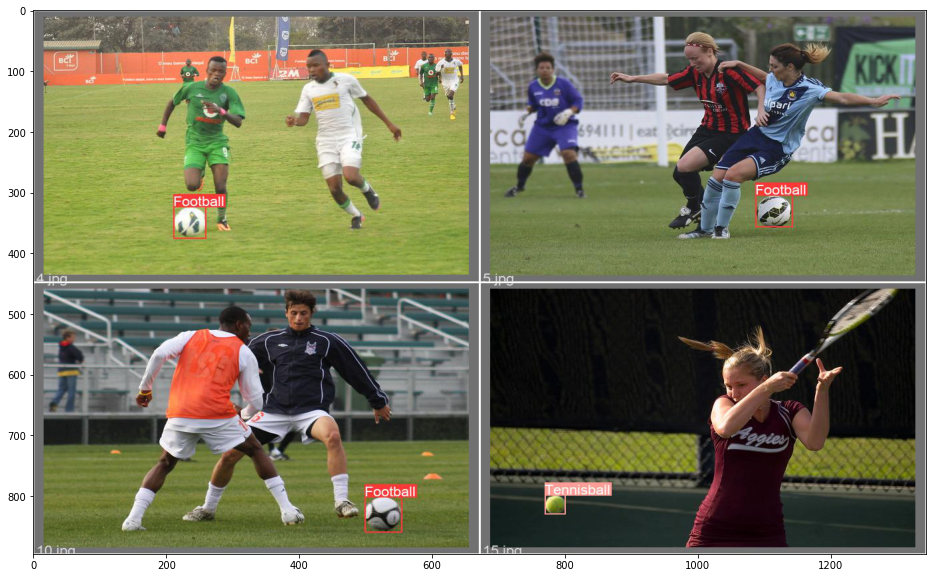

************* Test Predictions *************


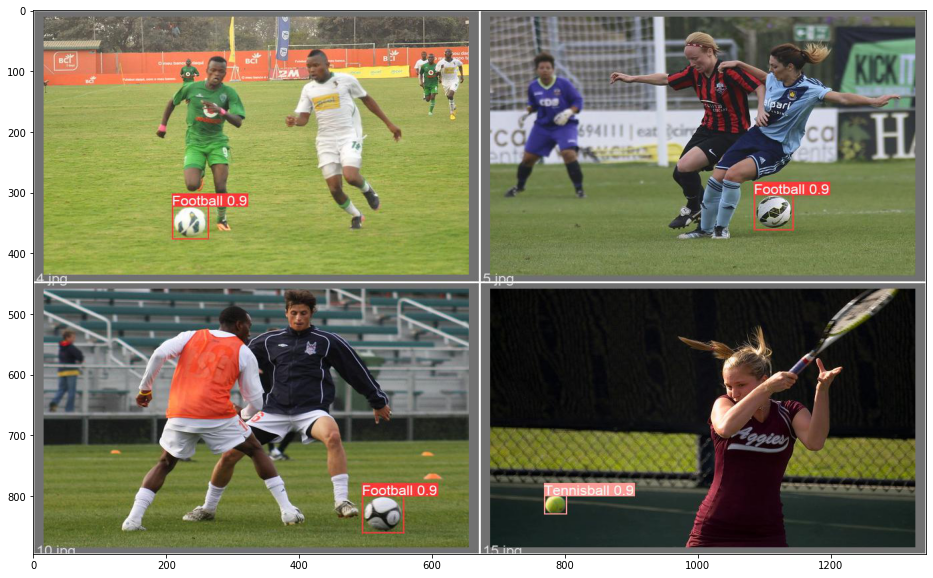

In [44]:
print('************* Test Labels *************')
pred_dir = '/content/yolov5/runs/train/exp4'
input_path = os.path.join(pred_dir, 'val_batch0_labels.jpg')
img = mpimg.imread(input_path)
plt.figure(figsize=(16,10))
imgplot = plt.imshow(img,aspect='auto')
plt.show()
print('************* Test Predictions *************')
pred_dir = '/content/yolov5/runs/train/exp4'
input_path = os.path.join(pred_dir, 'val_batch0_pred.jpg')
img = mpimg.imread(input_path)
plt.figure(figsize=(16,10))
imgplot = plt.imshow(img,aspect='auto')
plt.show()

************* Test Labels *************


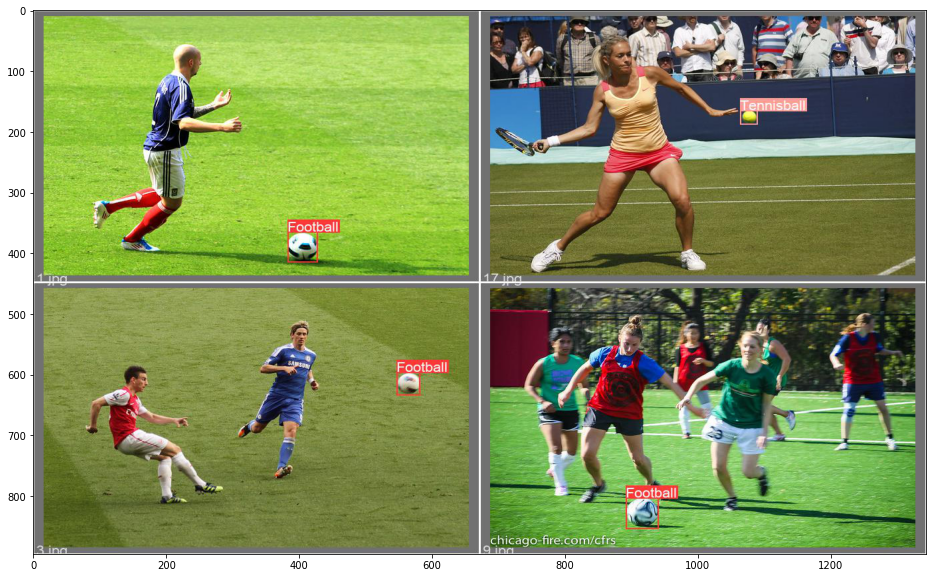

************* Test Predictions *************


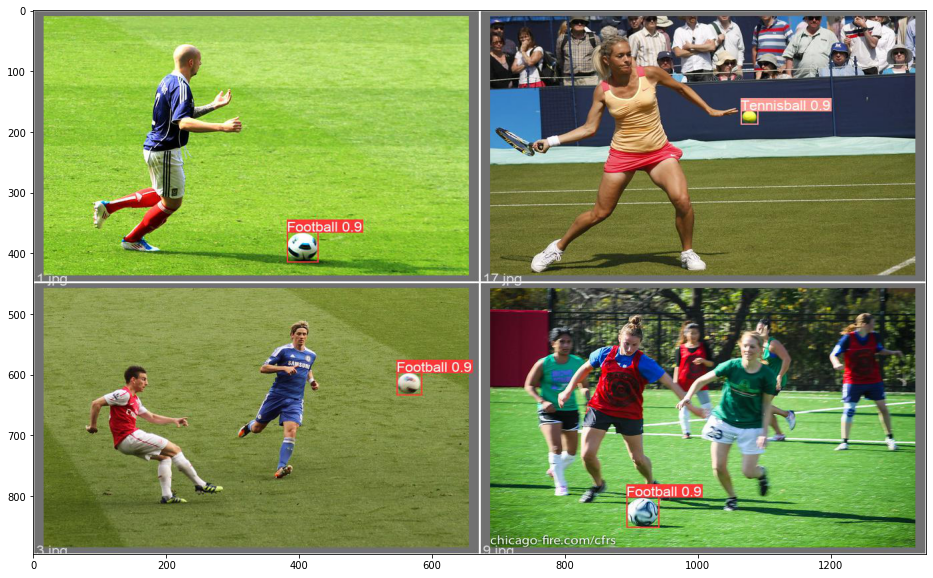

In [45]:
print('************* Test Labels *************')
pred_dir = '/content/yolov5/runs/train/exp4'
input_path = os.path.join(pred_dir, 'val_batch1_labels.jpg')
img = mpimg.imread(input_path)
plt.figure(figsize=(16,10))
imgplot = plt.imshow(img,aspect='auto')
plt.show()
print('************* Test Predictions *************')
pred_dir = '/content/yolov5/runs/train/exp4'
input_path = os.path.join(pred_dir, 'val_batch1_pred.jpg')
img = mpimg.imread(input_path)
plt.figure(figsize=(16,10))
imgplot = plt.imshow(img,aspect='auto')
plt.show()